<a href="https://colab.research.google.com/github/TheAthleticCoder/Basic-NLP-For-Hindi-And-English-/blob/main/Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing The Required Libraries
More libraries and models shall be imported later based on their need and usage for analysis.

In [1]:
!pip install numpy
!pip install sklearn
!pip install nltk
!pip install matplotlib
!pip install pandas

In [2]:
import collections
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline
import nltk
nltk.download('punkt')
!pip install seaborn
!pip install spacy
!python -m spacy download en
import random
text_f = ""

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/usr/local/lib/python3.7/dist-packages/en_core_web_sm -->
/usr/local/lib/python3.7/dist-packages/spacy/data/en
You can now load the model via spacy.load('en')





---


# **GENERATING INTUITIVE AND EXPRESSIVE WORDCLOUDS FOR ENGLISH TEXT**

---



# Importing BeautifulSoup
**Beautiful Soup** is a Python library that is used for **web scraping purposes** to pull the data out of HTML and XML files. It creates a **parse tree from page source code** that can be used to extract data in a hierarchical and more readable manner.
We shall use this to extract text from 'Wikipedia' and other such websites to get several words related to a desired context.

In [3]:
text_f = ""  

In [4]:
# Import packages
from urllib.request import urlopen
from bs4 import BeautifulSoup
import re
# Specify url of the web page
urls = ["https://en.wikipedia.org/wiki/History_of_India_(1947%E2%80%93present)","https://en.wikipedia.org/wiki/Sindh","https://en.wikipedia.org/wiki/Indus_Valley_Civilisation","https://en.wikipedia.org/wiki/Old_World","https://en.wikipedia.org/wiki/Historical_Vedic_religion#Brahmanism","https://en.wikipedia.org/wiki/Buddhism",
        "https://en.wikipedia.org/wiki/Hinduism","https://en.wikipedia.org/wiki/Indo-European_languages","https://en.wikipedia.org/wiki/Proto-Indo-European_language","https://en.wikipedia.org/wiki/Noble_Eightfold_Path","https://en.wikipedia.org/wiki/Vedic_period","https://en.wikipedia.org/wiki/Upanishads",
        "https://en.wikipedia.org/wiki/History_of_India","https://en.wikipedia.org/wiki/Maurya_Empire","https://en.wikipedia.org/wiki/Chandragupta_Maurya","https://en.wikipedia.org/wiki/East_India_Company","https://en.wikipedia.org/wiki/First_Opium_War","https://en.wikipedia.org/wiki/Tang_dynasty","https://en.wikipedia.org/wiki/Northern_and_Southern_dynasties",
        "https://en.wikipedia.org/wiki/Ancient_Egypt","https://en.wikipedia.org/wiki/Mahajanapadas","https://en.wikipedia.org/wiki/Indian_subcontinent","https://en.wikipedia.org/wiki/Chanakya","https://en.wikipedia.org/wiki/Vedanta","https://en.wikipedia.org/wiki/Bhagavad_Gita","https://en.wikipedia.org/wiki/Bhishma_Parva",
        "https://en.wikipedia.org/wiki/Brahman","https://en.wikipedia.org/wiki/Sanskrit","https://en.wikipedia.org/wiki/Devanagari","https://en.wikipedia.org/wiki/Bhagavata_Purana","https://en.wikipedia.org/wiki/Sanskrit#Classical_Sanskrit","https://en.wikipedia.org/wiki/Ramayana",
        "https://en.wikipedia.org/wiki/Kurukshetra_War","https://en.wikipedia.org/wiki/Gautama_Buddha","https://en.wikipedia.org/wiki/Jainism","https://en.wikipedia.org/wiki/Indian_religions","https://en.wikipedia.org/wiki/Sikhism","https://en.wikipedia.org/wiki/Guru_Nanak","https://en.wikipedia.org/wiki/Guru_Granth_Sahib",
        "https://en.wikipedia.org/wiki/Nanda_Empire","https://en.wikipedia.org/wiki/Chola_dynasty","https://en.wikipedia.org/wiki/Pandya_dynasty","https://en.wikipedia.org/wiki/Sangam_literature","https://en.wikipedia.org/wiki/Chera_dynasty","https://en.wikipedia.org/wiki/Ashoka","https://en.wikipedia.org/wiki/Sinhala_language",
        "https://en.wikipedia.org/wiki/Shunga_Empire","https://en.wikipedia.org/wiki/Satavahana_dynasty","https://en.wikipedia.org/wiki/Puranas","https://en.wikipedia.org/wiki/Bhakti_movement","https://en.wikipedia.org/wiki/Indo-Roman_trade_relations","https://en.wikipedia.org/wiki/Kushan_Empire","https://en.wikipedia.org/wiki/Samudragupta","https://en.wikipedia.org/wiki/Anuradhapura_Kingdom",
        "https://en.wikipedia.org/wiki/Western_Chalukya_Empire","https://en.wikipedia.org/wiki/Rashtrakuta_dynasty","https://en.wikipedia.org/wiki/Pala_Empire","https://en.wikipedia.org/wiki/Post-classical_history","https://en.wikipedia.org/wiki/Spread_of_Islam","https://en.wikipedia.org/wiki/Muhammad",
        "https://en.wikipedia.org/wiki/Gurjara-Pratihara_dynasty","https://en.wikipedia.org/wiki/Gurjara-Pratihara_dynasty","https://en.wikipedia.org/wiki/Chandelas_of_Jejakabhukti","https://en.wikipedia.org/wiki/Hindu_Shahi","https://en.wikipedia.org/wiki/Karkota_Dynasty","https://en.wikipedia.org/wiki/Vaishnavism",
        "https://en.wikipedia.org/wiki/Delhi_Sultanate","https://en.wikipedia.org/wiki/Mongol_invasions_of_India","https://en.wikipedia.org/wiki/Genghis_Khan","https://en.wikipedia.org/wiki/Sunni_Islam","https://en.wikipedia.org/wiki/Alauddin_Khalji",
        "https://en.wikipedia.org/wiki/Islamic_Golden_Age","https://en.wikipedia.org/wiki/Vijayanagara_Empire","https://en.wikipedia.org/wiki/Third_Battle_of_Panipat","https://en.wikipedia.org/wiki/Maratha_Empire",
        "https://en.wikipedia.org/wiki/Battle_of_Plassey","https://en.wikipedia.org/wiki/Mangal_Pandey","https://en.wikipedia.org/wiki/Indian_Penal_Code","https://en.wikipedia.org/wiki/Bengali_Renaissance","https://en.wikipedia.org/wiki/Company_rule_in_India",
        "https://en.wikipedia.org/wiki/Bahadur_Shah_Zafar","https://en.wikipedia.org/wiki/British_Raj","https://en.wikipedia.org/wiki/Indian_National_Congress","https://en.wikipedia.org/wiki/Indian_independence_movement","https://en.wikipedia.org/wiki/Colonial_India",
        "https://en.wikipedia.org/wiki/Gupta_Empire","https://en.wikipedia.org/wiki/Partition_of_India","https://en.wikipedia.org/wiki/Revolutionary_movement_for_Indian_independence",
        "https://en.wikipedia.org/wiki/Jallianwala_Bagh_massacre","https://en.wikipedia.org/wiki/Non-cooperation_movement"]
for url in urls:
  source = urlopen(url).read()
  # Make a soup 
  soup = BeautifulSoup(source,'html.parser')
  soup
  # Extract the plain text content from paragraphs
  paras = []
  for paragraph in soup.find_all('p'):
      paras.append(str(paragraph.text))

  # Extract text from paragraph headers
  heads = []
  for head in soup.find_all('span', attrs={'mw-headline'}):
      heads.append(str(head.text))

  # Interleave paragraphs & headers
  text = [val for pair in zip(paras, heads) for val in pair]
  text = ' '.join(text)

  # Drop footnote superscripts in brackets
  text = re.sub(r"\[.*?\]+", '', text)

  # Replace '\n' (a new line) with ''
  text = text.replace('\n', '')[:-11]
  text_f = text_f+text


In [5]:
global_text = text_f #to safeguard our information and ensure a backup to prevent text corruption

### The below code shows the number of sentences taken for our analysis to be more than 10,000 sentences.


In [6]:
text_sentences = text_f
import nltk
nltk.download('punkt')
from nltk.tokenize import sent_tokenize
number_of_sentences = sent_tokenize(text_f)

print(len(number_of_sentences)) #ensures that number of sentences > 10000

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
10367


## TOKENISATION OF SENTENCES

Text cleaning for **sentence tokenization** of English text. It is important to note that-

1.   In English, the sentence ends with the punctuation- "." or "?" or "!". 
2.   Sentence tokenization does not need us to clean up text in any manner.
3.   For calculating the TF-IDF, we need to make the text lower.


In [7]:
tfidf_sentences = number_of_sentences
number_of_sentences

[' 1947–1950: Dominion of India The history of independent India began when the country became an independent nation within the British Commonwealth on 15 August 1947.',
 'Direct administration by the British, which began in 1858, affected a political and economic unification of the subcontinent.',
 'When British rule came to an end in 1947, the subcontinent was partitioned along religious lines into two separate countries—India, with a majority of Hindus, and Pakistan, with a majority of Muslims.',
 'Concurrently the Muslim-majority northwest and east of British India was separated into the Dominion of Pakistan, by the partition of India.',
 'The partition led to a population transfer of more than 10 million people between India and Pakistan and the death of about one million people.',
 'Indian National Congress leader Jawaharlal Nehru became the first Prime Minister of India, but the leader most associated with the independence struggle, Mahatma Gandhi, accepted no office.',
 'The Co

## TOKENISATION OF WORDS

**Text cleaning** for **word tokenization** of English text. It is important to note that-

1.   In English, the sentence ends with the punctuation ".".
2.   The remaining punctuations remain the same with Hindi. 
3.   We remove all numbers from the text since we are doing *word* tokenisation. 
4.   We remove all the unecessary brackets as well.



In [8]:
#remove brackets content
text_f = re.sub(r"[\([{})\]]", "", text_f)
#remove punctuations
text_f = "".join(u for u in text_f if u not in ("@",",","?", ".", ";", ":", "!","#","$","%","&","–","-","_","`","~","'",'"'))
text_f = "".join([i for i in text_f if not i.isdigit()])
#text_words_f = "".join(filter(lambda x: not x.isdigit(), text_words))



### We fix the issue of having extra whitespaces in the text which unnecessarily occupies the list and can affect the frequency count.

In [9]:
text_f = text_f.split(' ')
text_f = list(filter(None, text_f))
text_f = ' '.join(text_f)
text_f = text_f[0:1000000]

### Corrected and cleaned the text for more effective and cleaner analysis

In [10]:
# Variables initialized for the analysis task
text_words = text_f
#text_sentences = text_f
text_pos = text_f
text_stem = text_f
#text_lem = text



### Now we print the sentences **with stop words** and the ones **without stopwords** in them and note the difference

In [11]:
from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS

# Load English tokenizer. 
# nlp object will be used to create 'doc' object which uses preprecoessing pipeline's components such as tagger, parser, NER and word vectors
nlp = English()

# Now we will process above text using 'nlp' object. Which is use to create documents with linguistic annotations and various nlp properties
my_doc = nlp(text_words)

# Above step has already tokenized our text but its in doc format, so lets write fo loop to create list of it
token_list = []
for token in my_doc:
    token_list.append(token.text)

# Create list of word tokens after removing stopwords
filtered_sentence =[] 

for word in token_list:
    lexeme = nlp.vocab[word]
    if lexeme.is_stop == False:
        filtered_sentence.append(word) 
print(token_list)
print(filtered_sentence) 
text_stem = filtered_sentence

['Dominion', 'of', 'India', 'The', 'history', 'of', 'independent', 'India', 'began', 'when', 'the', 'country', 'became', 'an', 'independent', 'nation', 'within', 'the', 'British', 'Commonwealth', 'on', 'August', 'Direct', 'administration', 'by', 'the', 'British', 'which', 'began', 'in', 'affected', 'a', 'political', 'and', 'economic', 'unification', 'of', 'the', 'subcontinent', 'When', 'British', 'rule', 'came', 'to', 'an', 'end', 'in', 'the', 'subcontinent', 'was', 'partitioned', 'along', 'religious', 'lines', 'into', 'two', 'separate', 'countries', '—', 'India', 'with', 'a', 'majority', 'of', 'Hindus', 'and', 'Pakistan', 'with', 'a', 'majority', 'of', 'Muslims', 'Concurrently', 'the', 'Muslimmajority', 'northwest', 'and', 'east', 'of', 'British', 'India', 'was', 'separated', 'into', 'the', 'Dominion', 'of', 'Pakistan', 'by', 'the', 'partition', 'of', 'India', 'The', 'partition', 'led', 'to', 'a', 'population', 'transfer', 'of', 'more', 'than', 'million', 'people', 'between', 'India',

## Plotting Analytical Graphs

In [12]:
with_sw = ' '.join(token_list)
without_sw = ' '.join(filtered_sentence)

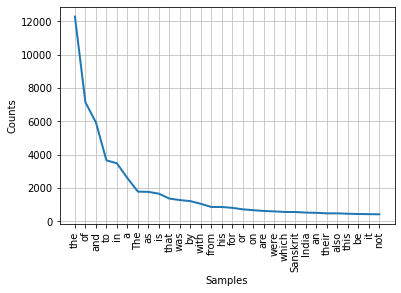

In [13]:
from nltk import FreqDist
tokens = nltk.tokenize.word_tokenize(with_sw)
fd = nltk.FreqDist(tokens)
fd.plot(30,cumulative=False)

This shows us that capitalization plays an important role in frequency counting. The word 'the' and 'The' appear separately eventhough they are the same thing. 

In [14]:
with_sw = with_sw.lower()

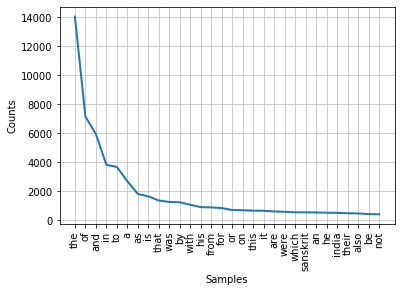

In [15]:
from nltk import FreqDist
tokens = nltk.tokenize.word_tokenize(with_sw)
fd = nltk.FreqDist(tokens)
fd.plot(30,cumulative=False)

### The above analysis is made **without** the removal of **stopwords**. Below, we shall remove all the stopwords and perform the analysis again.

In [16]:
without_sw = without_sw.lower()
without_list = without_sw.split(' ')

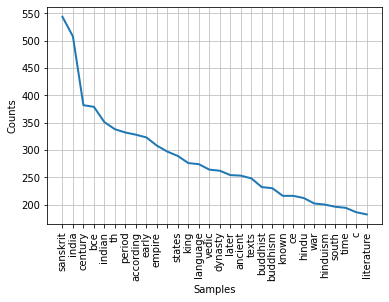

In [17]:
from nltk import FreqDist
fd = nltk.FreqDist(without_list)
fd.plot(30,cumulative=False)

# Parts Of Speech Tagging
We do **NOT** need to remove stopwords for POS. The more the context we have, the easier it is to POS tag. This may take several minutes to run and give output.

In [18]:
import spacy 
nlp = spacy.load('en_core_web_sm')
doc = nlp(text_pos)
 
# Iterate
for token in doc:
    # Print each token and its part-of-speech tag
    print(token, token.tag_, token.pos_, spacy.explain(token.tag_))

pos_list = []
for token in doc:
    pos_list.append([token,token.tag_])

Streaming output truncated to the last 5000 lines.
strong JJ ADJ adjective
Pala NNP PROPN noun, proper singular
ruler NN NOUN noun, singular or mass
who WP PRON wh-pronoun, personal
gained VBD VERB verb, past tense
control NN NOUN noun, singular or mass
of IN ADP conjunction, subordinating or preposition
Kamarupa NNP PROPN noun, proper singular
and CC CCONJ conjunction, coordinating
Kalinga NNP PROPN noun, proper singular
The DT DET determiner
empire NN NOUN noun, singular or mass
was VBD AUX verb, past tense
considerably RB ADV adverb
weakened VBN VERB verb, past participle
by IN ADP conjunction, subordinating or preposition
the DT DET determiner
th JJ ADJ adjective
century NN NOUN noun, singular or mass
with IN ADP conjunction, subordinating or preposition
many JJ ADJ adjective
areas NNS NOUN noun, plural
engulfed VBN VERB verb, past participle
in IN ADP conjunction, subordinating or preposition
rebellion NN NOUN noun, singular or mass
Expansion NN NOUN noun, singular or mass
under I

In [19]:
d2 = [item[1] for item in pos_list]

### Now, we plot the frequency of POS tags

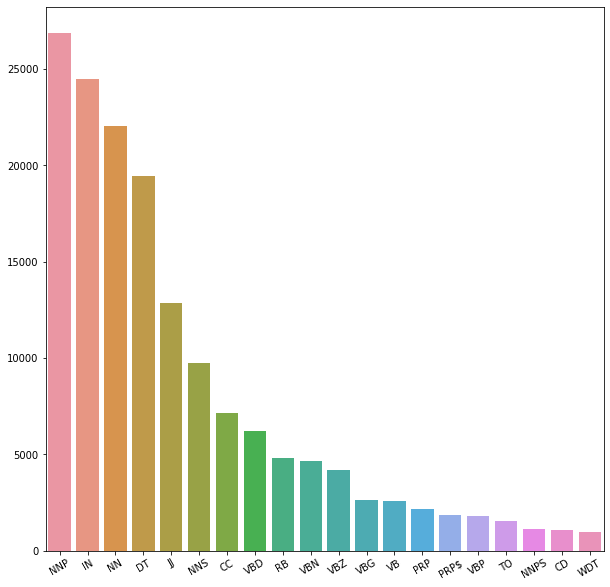

In [20]:
import seaborn as sns

all_fdist = FreqDist(d2).most_common(20)
all_fdist = pd.Series(dict(all_fdist))
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax)
plt.xticks(rotation=30);


# STEMMING
For the English language, you can choose between PorterStammer or LancasterStammer. PorterStemmer being the oldest one originally developed in 1979. LancasterStemmer was developed in 1990 and uses a more aggressive approach than Porter Stemming Algorithm.

In [24]:
n = 30000
trunc_list = random.sample(text_stem,n)

To avoid truncated output, we ask the random seed to pick a comprehensive list of words for stemming. 

In [25]:
from nltk.stem import PorterStemmer
from nltk.stem import LancasterStemmer

from nltk.tokenize import word_tokenize

porter = PorterStemmer()
lancaster=LancasterStemmer()

stem_list = []
print("{0:20}{1:20}{2:20}".format("Word","Porter Stemmer","Lancaster Stemmer"))
for word in trunc_list:
    print("{0:20}{1:20}{2:20}".format(word,porter.stem(word),lancaster.stem(word)))
    stem_list.append(porter.stem(word))

Streaming output truncated to the last 5000 lines.
hero                hero                hero                
thirtyday           thirtyday           thirtyday           
Gods                god                 god                 
renunciation        renunci             renunt              
aorist              aorist              aor                 
Tulsidas            tulsida             tulsida             
halfbuffalo         halfbuffalo         halfbuffalo         
Bhagavata           bhagavata           bhagavat            
BC                  BC                  bc                  
built               built               built               
led                 led                 led                 
Cholas              chola               chola               
government          govern              govern              
northern            northern            northern            
Theravada           theravada           theravad            
th                  th            

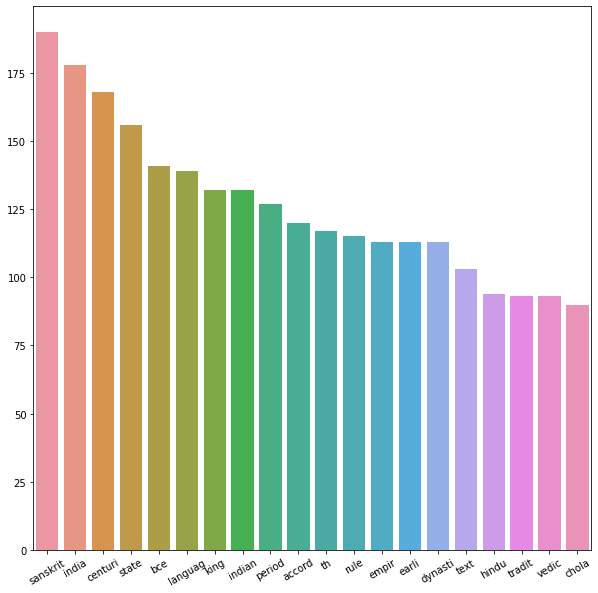

In [26]:
import seaborn as sns

all_fdist = FreqDist(stem_list).most_common(20)
all_fdist = pd.Series(dict(all_fdist))
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax)
plt.xticks(rotation=30);

## LEMMATIZATION

In [27]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [28]:
text_lem = ' '.join(filtered_sentence)

In order to avoid truncated output and time delays, we ask the random seed to select a comprehensive list of words for lemmatization as well.

In [29]:
text_lem_f = text_lem.lower()
from nltk.stem import 	WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()
tokenization = nltk.word_tokenize(text_lem)
n = 20000
lemma_list = []
tokenization = random.sample(tokenization,n)
for w in tokenization:
  print("Lemma for {} is {}".format(w, wordnet_lemmatizer.lemmatize(w)))
  lemma_list.append(wordnet_lemmatizer.lemmatize(w))

Streaming output truncated to the last 5000 lines.
Lemma for pardon is pardon
Lemma for domesticated is domesticated
Lemma for share is share
Lemma for mention is mention
Lemma for reign is reign
Lemma for Chimuka is Chimuka
Lemma for exempted is exempted
Lemma for India is India
Lemma for dialects is dialect
Lemma for Ravana is Ravana
Lemma for East is East
Lemma for Later is Later
Lemma for Theravada is Theravada
Lemma for India is India
Lemma for Kanchi is Kanchi
Lemma for closer is closer
Lemma for Ochre is Ochre
Lemma for Khalid is Khalid
Lemma for classical is classical
Lemma for Nankana is Nankana
Lemma for better is better
Lemma for fluctuating is fluctuating
Lemma for vols is vols
Lemma for central is central
Lemma for Mithila is Mithila
Lemma for coins is coin
Lemma for Uttarapatha is Uttarapatha
Lemma for Śuddhodana is Śuddhodana
Lemma for Sanskrit is Sanskrit
Lemma for grave is grave
Lemma for Nepali is Nepali
Lemma for Truths is Truths
Lemma for Sangam is Sangam
Lemma for 

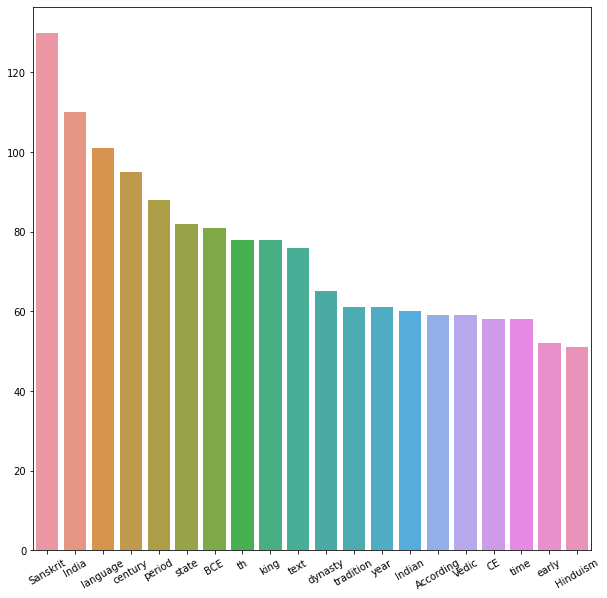

In [30]:
import seaborn as sns

all_fdist = FreqDist(lemma_list).most_common(20)
all_fdist = pd.Series(dict(all_fdist))
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax)
plt.xticks(rotation=30);

# MODIFIED WORDCLOUDS

In [31]:
text_cloud = global_text
text_cloud

' 1947–1950: Dominion of India The history of independent India began when the country became an independent nation within the British Commonwealth on 15 August 1947. Direct administration by the British, which began in 1858, affected a political and economic unification of the subcontinent. When British rule came to an end in 1947, the subcontinent was partitioned along religious lines into two separate countries—India, with a majority of Hindus, and Pakistan, with a majority of Muslims. Concurrently the Muslim-majority northwest and east of British India was separated into the Dominion of Pakistan, by the partition of India. The partition led to a population transfer of more than 10 million people between India and Pakistan and the death of about one million people. Indian National Congress leader Jawaharlal Nehru became the first Prime Minister of India, but the leader most associated with the independence struggle, Mahatma Gandhi, accepted no office. The Constitution adopted in 195

In [32]:
#remove brackets content
text_cloud = re.sub(r"[\([{})\]]", "", text_cloud)
#remove punctuations
text_cloud = "".join(u for u in text_cloud if u not in ("@",",", ";", ":","#","$","%","&","–","-","_","`","~","'",'"'))
text_cloud = "".join([i for i in text_cloud if not i.isdigit()])


In [33]:
text_cloud = text_cloud.split(' ')
text_cloud = list(filter(None, text_cloud))
text_cloud = ' '.join(text_cloud)

In [34]:
text_cloud = text_cloud.lower()
text_cloud_f = sent_tokenize(text_cloud)


In [35]:
nltk.download('stopwords')
from nltk.corpus import stopwords
stop = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [36]:
final = pd.DataFrame(text_cloud_f)
def remove_encoding_word(word):
    word = str(word)
    word = word.encode('ASCII', 'ignore').decode('ASCII')
    return word
def remove_encoding_text(text):
    text = str(text)
    text = ' '.join(remove_encoding_word(word) for word in text.split() if word not in stop)
    return text
final = final.apply(remove_encoding_text)

In [37]:
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import WordNetLemmatizer
lemma = WordNetLemmatizer().lemmatize
def tokenize(document):
    tokens = [lemma(w) for w in document.split() if len(w) > 3 and w.isalpha()]
    return tokens

We take both important **Unigrams** and **Bigrams** for our Wordcloud generation

In [38]:
vectorizer = TfidfVectorizer(tokenizer = tokenize, ngram_range = ((1,2)), stop_words = stop, strip_accents = 'unicode')

In [39]:
tdm = vectorizer.fit_transform(final)
vectorizer.vocabulary_.items()
tfidf_weights = [(word, tdm.getcol(idx).sum()) for word, idx in vectorizer.vocabulary_.items()]

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


### We see the first 20 weights to verify that we are proceeding in the right direction

In [40]:
tfidf_weights[0:20]

[('dominion', 0.1203858530857692),
 ('india', 0.1203858530857692),
 ('history', 0.1203858530857692),
 ('independent', 0.1203858530857692),
 ('direct', 0.1203858530857692),
 ('administration', 0.1203858530857692),
 ('british', 0.2407717061715384),
 ('rule', 0.1203858530857692),
 ('came', 0.1203858530857692),
 ('concurrently', 0.1203858530857692),
 ('muslimmajority', 0.1203858530857692),
 ('northwest', 0.1203858530857692),
 ('partition', 0.1203858530857692),
 ('population', 0.1203858530857692),
 ('transfer', 0.1203858530857692),
 ('large', 0.1203858530857692),
 ('crowd', 0.1203858530857692),
 ('gathered', 0.1203858530857692),
 ('jallianwala', 0.1203858530857692),
 ('civilian', 0.1203858530857692)]

(-0.5, 749.5, 599.5, -0.5)

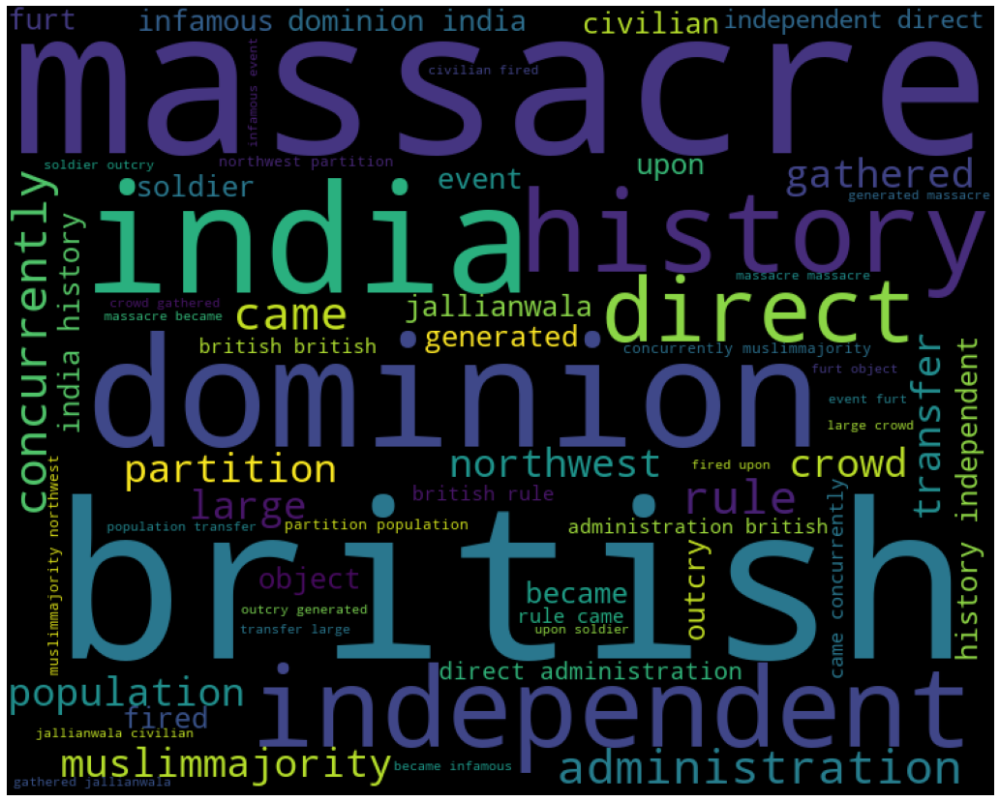

In [41]:
from wordcloud import WordCloud
w = WordCloud(width=750, height=600, mode='RGBA', background_color='black', max_words=2000).fit_words(dict(tfidf_weights))
plt.figure(figsize=(20,15))
plt.imshow(w)
plt.axis('off')

# AVERAGE WORDCLOUD

### This is a generic wordcloud which accounts for all the parts of speech without the stopwords. More details regarding wordcloud generation and parameters are written in the report.

In [42]:
stopwords = STOPWORDS
!pip install wordcloud
wordcloud = WordCloud(stopwords=stopwords, background_color="white", max_words=1000).generate(text_f)

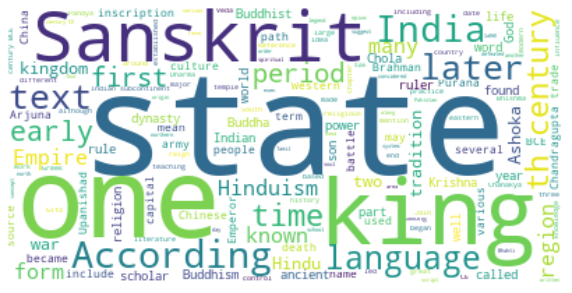

In [43]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

# WordCloud comprising of ONLY nouns:
This is a precise and better wordcloud comprising of ONLY nouns. it gives a clearer picture about the keywords and their frequency in the text.

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


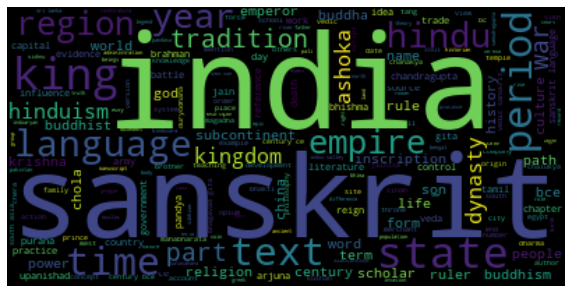

In [44]:
import nltk
nltk.download('averaged_perceptron_tagger')
# function to test if something is a noun
is_noun = lambda pos: pos[:2] == 'NN'
# do the nlp stuff
tokenized = nltk.word_tokenize(text_f)
nouns = [word.lower() for (word, pos) in nltk.pos_tag(tokenized) if is_noun(pos)]
# Joining them all
text_noun = " ".join(nouns)
# Then print the wordcloud
wordcloud = WordCloud(stopwords=STOPWORDS).generate(text_noun)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [45]:
#blank

In [46]:
#blank


---


# **GENERATING INTUTIVE AND EXPRESSIVE WORDCLOUDS FOR HINDI TEXT**

---


# Importing BeautifulSoup
**Beautiful Soup** is a Python library that is used for **web scraping purposes** to pull the data out of HTML and XML files. It creates a **parse tree from page source code** that can be used to extract data in a hierarchical and more readable manner.
We shall use this to extract text from 'Wikipedia' and other such websites to get several words related to a desired context.

In [47]:
!pip install indicnlp
!pip install indic-nlp-library

In [48]:
text_f=""

In [49]:
from urllib.request import urlopen
from bs4 import BeautifulSoup
import re
# Specify url of the web page
urls = ["https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%BF%E0%A4%82%E0%A4%A7%E0%A5%81_%E0%A4%98%E0%A4%BE%E0%A4%9F%E0%A5%80_%E0%A4%B8%E0%A4%AD%E0%A5%8D%E0%A4%AF%E0%A4%A4%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%82%E0%A4%B8%E0%A5%8D%E0%A4%95%E0%A5%83%E0%A4%A4_%E0%A4%AD%E0%A4%BE%E0%A4%B7%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4_%E0%A4%95%E0%A4%BE_%E0%A4%B8%E0%A4%82%E0%A4%B5%E0%A4%BF%E0%A4%A7%E0%A4%BE%E0%A4%A8",
        "https://hi.wikipedia.org/wiki/%E0%A4%B5%E0%A4%BF%E0%A4%9C%E0%A4%AF%E0%A4%A8%E0%A4%97%E0%A4%B0_%E0%A4%B8%E0%A4%BE%E0%A4%AE%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A5%8D%E0%A4%AF","https://hi.wikipedia.org/wiki/%E0%A4%95%E0%A4%82%E0%A4%AA%E0%A4%A8%E0%A5%80_%E0%A4%B0%E0%A4%BE%E0%A4%9C","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A5%80%E0%A4%AE%E0%A4%B0%E0%A4%BE%E0%A4%B5_%E0%A4%86%E0%A4%AE%E0%A5%8D%E0%A4%AC%E0%A5%87%E0%A4%A1%E0%A4%95%E0%A4%B0","https://hi.wikipedia.org/wiki/%E0%A4%B5%E0%A5%88%E0%A4%A6%E0%A4%BF%E0%A4%95_%E0%A4%B8%E0%A4%AD%E0%A5%8D%E0%A4%AF%E0%A4%A4%E0%A4%BE",
        "https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%97%E0%A4%B5%E0%A4%A4_%E0%A4%AA%E0%A5%81%E0%A4%B0%E0%A4%BE%E0%A4%A3","https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%B9%E0%A4%BE%E0%A4%9C%E0%A4%A8%E0%A4%AA%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%AC%E0%A5%8C%E0%A4%A6%E0%A5%8D%E0%A4%A7_%E0%A4%A7%E0%A4%B0%E0%A5%8D%E0%A4%AE","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4_%E0%A4%95%E0%A5%87_%E0%A4%B5%E0%A4%BF%E0%A4%A6%E0%A5%87%E0%A4%B6_%E0%A4%B8%E0%A4%82%E0%A4%AC%E0%A4%82%E0%A4%A7","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4_%E0%A4%B8%E0%A4%B0%E0%A4%95%E0%A4%BE%E0%A4%B0",
        "https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B0%E0%A4%BE%E0%A4%B7%E0%A5%8D%E0%A4%9F%E0%A5%8D%E0%A4%B0%E0%A5%80%E0%A4%AF_%E0%A4%95%E0%A4%BE%E0%A4%82%E0%A4%97%E0%A5%8D%E0%A4%B0%E0%A5%87%E0%A4%B8","https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%B9%E0%A4%BE%E0%A4%A4%E0%A5%8D%E0%A4%AE%E0%A4%BE_%E0%A4%97%E0%A4%BE%E0%A4%82%E0%A4%A7%E0%A5%80","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A5%80%E0%A4%AE%E0%A4%B0%E0%A4%BE%E0%A4%B5_%E0%A4%86%E0%A4%AE%E0%A5%8D%E0%A4%AC%E0%A5%87%E0%A4%A1%E0%A4%95%E0%A4%B0",
        "https://hi.wikipedia.org/wiki/%E0%A5%A7%E0%A5%AE%E0%A5%AB%E0%A5%AD_%E0%A4%95%E0%A4%BE_%E0%A4%AA%E0%A5%8D%E0%A4%B0%E0%A4%A5%E0%A4%AE_%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A5%8D%E0%A4%B5%E0%A4%A4%E0%A4%82%E0%A4%A4%E0%A5%8D%E0%A4%B0%E0%A4%A4%E0%A4%BE_%E0%A4%B8%E0%A4%82%E0%A4%97%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%AE","https://hi.wikipedia.org/wiki/%E0%A4%AC%E0%A5%8D%E0%A4%B0%E0%A4%BF%E0%A4%9F%E0%A4%BF%E0%A4%B6_%E0%A4%B8%E0%A4%BE%E0%A4%AE%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A5%8D%E0%A4%AF",
        "https://hi.wikipedia.org/wiki/%E0%A4%9A%E0%A5%8B%E0%A4%B2_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%9A%E0%A5%8B%E0%A4%B2_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%9A%E0%A4%BE%E0%A4%B2%E0%A5%81%E0%A4%95%E0%A5%8D%E0%A4%AF_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%AC%E0%A5%8C%E0%A4%A6%E0%A5%8D%E0%A4%A7_%E0%A4%A7%E0%A4%B0%E0%A5%8D%E0%A4%AE","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%BF%E0%A4%A8%E0%A5%8D%E0%A4%A7%E0%A5%81_%E0%A4%A8%E0%A4%A6%E0%A5%80",
        "https://hi.wikipedia.org/wiki/%E0%A4%B5%E0%A5%87%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%B0%E0%A4%BE%E0%A4%AE%E0%A4%BE%E0%A4%AF%E0%A4%A3","https://hi.wikipedia.org/wiki/%E0%A4%8B%E0%A4%97%E0%A5%8D%E0%A4%B5%E0%A5%87%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%AF%E0%A4%9C%E0%A5%81%E0%A4%B0%E0%A5%8D%E0%A4%B5%E0%A5%87%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%BE%E0%A4%AE%E0%A4%B5%E0%A5%87%E0%A4%A6_%E0%A4%B8%E0%A4%82%E0%A4%B9%E0%A4%BF%E0%A4%A4%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%89%E0%A4%AA%E0%A4%A8%E0%A4%BF%E0%A4%B7%E0%A4%A6%E0%A5%8D","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%82%E0%A4%B8%E0%A5%8D%E0%A4%95%E0%A5%83%E0%A4%A4_%E0%A4%AD%E0%A4%BE%E0%A4%B7%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%AB%E0%A4%BC%E0%A4%BE%E0%A4%B0%E0%A4%B8%E0%A5%80_%E0%A4%AD%E0%A4%BE%E0%A4%B7%E0%A4%BE",
        "https://hi.wikipedia.org/wiki/%E0%A4%B0%E0%A4%BE%E0%A4%AE%E0%A4%BE%E0%A4%AF%E0%A4%A3","https://hi.wikipedia.org/wiki/%E0%A4%AA%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%9A%E0%A5%80%E0%A4%A8_%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4",
        "https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A5%8C%E0%A4%B0%E0%A5%8D%E0%A4%AF_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%9A%E0%A4%A8%E0%A5%8D%E0%A4%A6%E0%A5%8D%E0%A4%B0%E0%A4%97%E0%A5%81%E0%A4%AA%E0%A5%8D%E0%A4%A4_%E0%A4%AE%E0%A5%8C%E0%A4%B0%E0%A5%8D%E0%A4%AF","https://hi.wikipedia.org/wiki/%E0%A4%9A%E0%A4%BE%E0%A4%A3%E0%A4%95%E0%A5%8D%E0%A4%AF","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A5%81%E0%A4%AD%E0%A4%BE%E0%A4%B7_%E0%A4%9A%E0%A4%A8%E0%A5%8D%E0%A4%A6%E0%A5%8D%E0%A4%B0_%E0%A4%AC%E0%A5%8B%E0%A4%B8","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A5%8D%E0%A4%B5%E0%A4%A4%E0%A4%A8%E0%A5%8D%E0%A4%A4%E0%A5%8D%E0%A4%B0%E0%A4%A4%E0%A4%BE_%E0%A4%86%E0%A4%A8%E0%A5%8D%E0%A4%A6%E0%A5%8B%E0%A4%B2%E0%A4%A8",
        "https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A5%8D%E0%A4%B5%E0%A4%A4%E0%A4%82%E0%A4%A4%E0%A5%8D%E0%A4%B0%E0%A4%A4%E0%A4%BE_%E0%A4%85%E0%A4%A7%E0%A4%BF%E0%A4%A8%E0%A4%BF%E0%A4%AF%E0%A4%AE_%E0%A5%A7%E0%A5%AF%E0%A5%AA%E0%A5%AD","https://hi.wikipedia.org/wiki/%E0%A4%97%E0%A5%8B%E0%A4%B5%E0%A4%BF%E0%A4%A8%E0%A5%8D%E0%A4%A6_%E0%A4%9A%E0%A4%A8%E0%A5%8D%E0%A4%A6%E0%A5%8D%E0%A4%B0_%E0%A4%AA%E0%A4%BE%E0%A4%A3%E0%A5%8D%E0%A4%A1%E0%A5%87%E0%A4%AF",
        "https://hi.wikipedia.org/wiki/%E0%A4%97%E0%A5%81%E0%A4%AA%E0%A5%8D%E0%A4%A4_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%97%E0%A5%81%E0%A4%AA%E0%A5%8D%E0%A4%A4_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%87%E0%A4%B2%E0%A4%BE%E0%A4%B9%E0%A4%BE%E0%A4%AC%E0%A4%BE%E0%A4%A6",
        "https://hi.wikipedia.org/wiki/%E0%A4%AA%E0%A4%BE%E0%A4%A3%E0%A5%8D%E0%A4%A1%E0%A5%8D%E0%A4%AF_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%AA%E0%A4%B2%E0%A5%8D%E0%A4%B2%E0%A4%B5_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%A6%E0%A4%BF%E0%A4%B2%E0%A5%8D%E0%A4%B2%E0%A5%80_%E0%A4%B8%E0%A4%B2%E0%A5%8D%E0%A4%A4%E0%A4%A8%E0%A4%A4",
        "https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A5%81%E0%A4%AD%E0%A4%BE%E0%A4%B7_%E0%A4%9A%E0%A4%A8%E0%A5%8D%E0%A4%A6%E0%A5%8D%E0%A4%B0_%E0%A4%AC%E0%A5%8B%E0%A4%B8","https://hi.wikipedia.org/wiki/%E0%A4%A4%E0%A4%B0%E0%A4%BE%E0%A4%87%E0%A4%A8_%E0%A4%95%E0%A4%BE_%E0%A4%AF%E0%A5%81%E0%A4%A6%E0%A5%8D%E0%A4%A7",
        "https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4-%E0%A4%9A%E0%A5%80%E0%A4%A8_%E0%A4%AF%E0%A5%81%E0%A4%A6%E0%A5%8D%E0%A4%A7","https://hi.wikipedia.org/wiki/%E0%A4%AC%E0%A5%8D%E0%A4%B0%E0%A4%BF%E0%A4%9F%E0%A4%BF%E0%A4%B6_%E0%A4%B0%E0%A4%BE%E0%A4%9C_%E0%A4%95%E0%A4%BE_%E0%A4%87%E0%A4%A4%E0%A4%BF%E0%A4%B9%E0%A4%BE%E0%A4%B8","https://hi.wikipedia.org/wiki/%E0%A4%AC%E0%A5%8D%E0%A4%B0%E0%A4%BF%E0%A4%9F%E0%A4%BF%E0%A4%B6_%E0%A4%B0%E0%A4%BE%E0%A4%9C_%E0%A4%95%E0%A4%BE_%E0%A4%87%E0%A4%A4%E0%A4%BF%E0%A4%B9%E0%A4%BE%E0%A4%B8",
        "https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%85%E0%A4%B0%E0%A5%8D%E0%A4%A5%E0%A4%B5%E0%A5%8D%E0%A4%AF%E0%A4%B5%E0%A4%B8%E0%A5%8D%E0%A4%A5%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%85%E0%A4%B0%E0%A5%8D%E0%A4%A5%E0%A4%B5%E0%A5%8D%E0%A4%AF%E0%A4%B5%E0%A4%B8%E0%A5%8D%E0%A4%A5%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%9C%E0%A4%B2%E0%A4%BF%E0%A4%AF%E0%A4%BE%E0%A4%81%E0%A4%B5%E0%A4%BE%E0%A4%B2%E0%A4%BE_%E0%A4%AC%E0%A4%BE%E0%A4%97_%E0%A4%B9%E0%A4%A4%E0%A5%8D%E0%A4%AF%E0%A4%BE%E0%A4%95%E0%A4%BE%E0%A4%82%E0%A4%A1","https://hi.wikipedia.org/wiki/%E0%A4%9C%E0%A4%B2%E0%A4%BF%E0%A4%AF%E0%A4%BE%E0%A4%81%E0%A4%B5%E0%A4%BE%E0%A4%B2%E0%A4%BE_%E0%A4%AC%E0%A4%BE%E0%A4%97_%E0%A4%B9%E0%A4%A4%E0%A5%8D%E0%A4%AF%E0%A4%BE%E0%A4%95%E0%A4%BE%E0%A4%82%E0%A4%A1",
        "https://hi.wikipedia.org/wiki/%E0%A4%AA%E0%A4%B9%E0%A4%B2%E0%A4%BE_%E0%A4%B5%E0%A4%BF%E0%A4%B6%E0%A5%8D%E0%A4%B5_%E0%A4%AF%E0%A5%81%E0%A4%A6%E0%A5%8D%E0%A4%A7","https://hi.wikipedia.org/wiki/%E0%A4%94%E0%A4%A6%E0%A5%8D%E0%A4%AF%E0%A5%8B%E0%A4%97%E0%A4%BF%E0%A4%95_%E0%A4%95%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%82%E0%A4%A4%E0%A4%BF",
        "https://hi.wikipedia.org/wiki/%E0%A4%9B%E0%A4%BE%E0%A4%82%E0%A4%A6%E0%A5%8B%E0%A4%97%E0%A5%8D%E0%A4%AF_%E0%A4%89%E0%A4%AA%E0%A4%A8%E0%A4%BF%E0%A4%B7%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%BE%E0%A4%A3%E0%A5%8D%E0%A4%A1%E0%A5%82%E0%A4%95%E0%A5%8D%E0%A4%AF%E0%A5%8B%E0%A4%AA%E0%A4%A8%E0%A4%BF%E0%A4%B7%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%BE%E0%A4%A3%E0%A5%8D%E0%A4%A1%E0%A5%82%E0%A4%95%E0%A5%8D%E0%A4%AF%E0%A5%8B%E0%A4%AA%E0%A4%A8%E0%A4%BF%E0%A4%B7%E0%A4%A6",
        "https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%B0%E0%A4%BE%E0%A4%A0%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%B0%E0%A4%BE%E0%A4%A0%E0%A4%BE_%E0%A4%B8%E0%A4%BE%E0%A4%AE%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A5%8D%E0%A4%AF",
        "https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A4%82%E0%A4%B5%E0%A4%BF%E0%A4%A7%E0%A4%BE%E0%A4%A8_%E0%A4%B8%E0%A4%AD%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A4%82%E0%A4%B5%E0%A4%BF%E0%A4%A7%E0%A4%BE%E0%A4%A8_%E0%A4%B8%E0%A4%AD%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%97%E0%A4%A3%E0%A4%A4%E0%A4%A8%E0%A5%8D%E0%A4%A4%E0%A5%8D%E0%A4%B0_%E0%A4%A6%E0%A4%BF%E0%A4%B5%E0%A4%B8_(%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4)",
        "https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%AE%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%BE%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%AA%E0%A4%BE%E0%A4%95%E0%A4%BF%E0%A4%B8%E0%A5%8D%E0%A4%A4%E0%A4%BE%E0%A4%A8_%E0%A4%85%E0%A4%A7%E0%A4%BF%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A5%8D%E0%A4%AF","https://hi.wikipedia.org/wiki/%E0%A4%A4%E0%A4%AE%E0%A4%BF%E0%A4%B2_%E0%A4%AD%E0%A4%BE%E0%A4%B7%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%95%E0%A5%81%E0%A4%B7%E0%A4%BE%E0%A4%A3_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6",
        "https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A4%82%E0%A4%B8%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A5%8D%E0%A4%AF_%E0%A4%B8%E0%A4%AD%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%B2%E0%A5%8B%E0%A4%95_%E0%A4%B8%E0%A4%AD%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%B0%E0%A4%95%E0%A4%BE%E0%A4%B0",
        "https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4_%E0%A4%95%E0%A4%BE_%E0%A4%89%E0%A4%9A%E0%A5%8D%E0%A4%9A%E0%A4%A4%E0%A4%AE_%E0%A4%A8%E0%A5%8D%E0%A4%AF%E0%A4%BE%E0%A4%AF%E0%A4%BE%E0%A4%B2%E0%A4%AF","https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A5%87%E0%A4%95_%E0%A4%87%E0%A4%A8_%E0%A4%87%E0%A4%82%E0%A4%A1%E0%A4%BF%E0%A4%AF%E0%A4%BE",
        "https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A5%87%E0%A4%95_%E0%A4%87%E0%A4%A8_%E0%A4%87%E0%A4%82%E0%A4%A1%E0%A4%BF%E0%A4%AF%E0%A4%BE"]

urls1 = ["https://hi.wikipedia.org/wiki/%E0%A4%AA%E0%A4%B9%E0%A4%B2%E0%A4%BE_%E0%A4%B5%E0%A4%BF%E0%A4%B6%E0%A5%8D%E0%A4%B5_%E0%A4%AF%E0%A5%81%E0%A4%A6%E0%A5%8D%E0%A4%A7","https://hi.wikipedia.org/wiki/%E0%A4%AA%E0%A4%B9%E0%A4%B2%E0%A4%BE_%E0%A4%B5%E0%A4%BF%E0%A4%B6%E0%A5%8D%E0%A4%B5_%E0%A4%AF%E0%A5%81%E0%A4%A6%E0%A5%8D%E0%A4%A7",
         "https://hi.wikipedia.org/wiki/%E0%A4%94%E0%A4%A6%E0%A5%8D%E0%A4%AF%E0%A5%8B%E0%A4%97%E0%A4%BF%E0%A4%95_%E0%A4%95%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%82%E0%A4%A4%E0%A4%BF","https://hi.wikipedia.org/wiki/%E0%A4%94%E0%A4%A6%E0%A5%8D%E0%A4%AF%E0%A5%8B%E0%A4%97%E0%A4%BF%E0%A4%95_%E0%A4%95%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%82%E0%A4%A4%E0%A4%BF","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4_%E0%A4%95%E0%A4%BE_%E0%A4%B5%E0%A4%BF%E0%A4%AD%E0%A4%BE%E0%A4%9C%E0%A4%A8",
         "https://hi.wikipedia.org/wiki/%E0%A4%97%E0%A5%81%E0%A4%AA%E0%A5%8D%E0%A4%A4_%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%82%E0%A4%B6","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A5%8D%E0%A4%B5%E0%A4%A4%E0%A4%82%E0%A4%A4%E0%A5%8D%E0%A4%B0%E0%A4%A4%E0%A4%BE_%E0%A4%A6%E0%A4%BF%E0%A4%B5%E0%A4%B8_(%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4)","https://hi.wikipedia.org/wiki/%E0%A4%9B%E0%A4%BE%E0%A4%82%E0%A4%A6%E0%A5%8B%E0%A4%97%E0%A5%8D%E0%A4%AF_%E0%A4%89%E0%A4%AA%E0%A4%A8%E0%A4%BF%E0%A4%B7%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%9B%E0%A4%BE%E0%A4%82%E0%A4%A6%E0%A5%8B%E0%A4%97%E0%A5%8D%E0%A4%AF_%E0%A4%89%E0%A4%AA%E0%A4%A8%E0%A4%BF%E0%A4%B7%E0%A4%A6",
         "https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%BE%E0%A4%A3%E0%A5%8D%E0%A4%A1%E0%A5%82%E0%A4%95%E0%A5%8D%E0%A4%AF%E0%A5%8B%E0%A4%AA%E0%A4%A8%E0%A4%BF%E0%A4%B7%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%B0%E0%A4%BE%E0%A4%A0%E0%A4%BE",
         "https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A4%B0%E0%A4%BE%E0%A4%A0%E0%A4%BE_%E0%A4%B8%E0%A4%BE%E0%A4%AE%E0%A5%8D%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A5%8D%E0%A4%AF","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A4%82%E0%A4%B5%E0%A4%BF%E0%A4%A7%E0%A4%BE%E0%A4%A8_%E0%A4%B8%E0%A4%AD%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A4%82%E0%A4%B5%E0%A4%BF%E0%A4%A7%E0%A4%BE%E0%A4%A8_%E0%A4%B8%E0%A4%AD%E0%A4%BE",
         "https://hi.wikipedia.org/wiki/%E0%A4%97%E0%A4%A3%E0%A4%A4%E0%A4%A8%E0%A5%8D%E0%A4%A4%E0%A5%8D%E0%A4%B0_%E0%A4%A6%E0%A4%BF%E0%A4%B5%E0%A4%B8_(%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4)","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%AE%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%BE%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%AE%E0%A4%BE%E0%A4%9C%E0%A4%B5%E0%A4%BE%E0%A4%A6","https://hi.wikipedia.org/wiki/%E0%A4%AD%E0%A4%BE%E0%A4%B0%E0%A4%A4%E0%A5%80%E0%A4%AF_%E0%A4%B8%E0%A4%82%E0%A4%B8%E0%A4%A6",
         "https://hi.wikipedia.org/wiki/%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A5%8D%E0%A4%AF_%E0%A4%B8%E0%A4%AD%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%B0%E0%A4%BE%E0%A4%9C%E0%A5%8D%E0%A4%AF_%E0%A4%B8%E0%A4%AD%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%B2%E0%A5%8B%E0%A4%95_%E0%A4%B8%E0%A4%AD%E0%A4%BE","https://hi.wikipedia.org/wiki/%E0%A4%B2%E0%A5%8B%E0%A4%95_%E0%A4%B8%E0%A4%AD%E0%A4%BE",
         "https://hi.wikipedia.org/wiki/%E0%A4%B8%E0%A4%B0%E0%A4%95%E0%A4%BE%E0%A4%B0","https://hi.wikipedia.org/wiki/%E0%A4%AE%E0%A5%87%E0%A4%95_%E0%A4%87%E0%A4%A8_%E0%A4%87%E0%A4%82%E0%A4%A1%E0%A4%BF%E0%A4%AF%E0%A4%BE"]
for url in urls:
  source = urlopen(url).read()
  # Make a soup 
  soup = BeautifulSoup(source,'html.parser')
  soup
  # Extract the plain text content from paragraphs
  paras = []
  for paragraph in soup.find_all('p'):
      paras.append(str(paragraph.text))

  # Extract text from paragraph headers
  heads = []
  for head in soup.find_all('span', attrs={'mw-headline'}):
      heads.append(str(head.text))

  # Interleave paragraphs & headers
  text = [val for pair in zip(paras, heads) for val in pair]
  text = ' '.join(text)

  # Drop footnote superscripts in brackets
  text = re.sub(r"\[.*?\]+", '', text)

  # Replace '\n' (a new line) with ''
  text = text.replace('\n', '')[:-11]
  text_f = text_f+text

text_f1=""
for url in urls1:
  source = urlopen(url).read()
  # Make a soup 
  soup = BeautifulSoup(source,'html.parser')
  soup
  # Extract the plain text content from paragraphs
  paras = []
  for paragraph in soup.find_all('p'):
      paras.append(str(paragraph.text))

  # Extract text from paragraph headers
  heads = []
  for head in soup.find_all('span', attrs={'mw-headline'}):
      heads.append(str(head.text))

  # Interleave paragraphs & headers
  text = [val for pair in zip(paras, heads) for val in pair]
  text = ' '.join(text)

  # Drop footnote superscripts in brackets
  text = re.sub(r"\[.*?\]+", '', text)

  # Replace '\n' (a new line) with ''
  text = text.replace('\n', '')[:-11]
  text_f1 = text_f1+text

glob_text = text_f+text_f1

### The code snippet below shows the number of sentences to be more than 10,000 sentences for analysis.

In [50]:
from indicnlp.tokenize import sentence_tokenize
text_sentences = glob_text
indic_string=glob_text
sentences=sentence_tokenize.sentence_split(indic_string, lang='hi')
print(len(sentences))
#for t in sentences:
 #   print(t)

6245


In [51]:
text_f = glob_text
# Variables initialized for the analysis task
text_words = text_f
text_pos = text_f
text_stem = text_f
#text_lem = text



## Cleaning Up Text For Further Analysis
Here, we-

1.   Remove brackets
2.   Remove unecessary punctuations
3.   Remove English and other foreign characters
4.   Remove mathematical numerals (numbers)



In [52]:
text_words = text_f

In [53]:
#remove brackets content
text_words = re.sub(r"[\([{})\]]", "", text_words)
#remove punctuations
text_words = "".join(u for u in text_words if u not in ("@",",","।","?", ".", ";", ":", "!","#","$","%","&","–","-","_"))
text_words = "".join(j for j in text_words if j not in ("a","b","c","d","e","f","g","h","i","j","k","l","m","n","o","p","q","r","s","t","u","v","w","x","y","z","A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"))
#text_words = "".join(j for j in text_words if not j.isalpha())
text_words_f = "".join([i for i in text_words if not i.isdigit()])
#text_words_f = "".join(filter(lambda x: not x.isdigit(), text_words))
print(text_words_f)
print(len(text_words_f))
text_stem = text_words_f
text_lem = text_words_f

भारत आधिकारिक नाम भारत गणराज्य अंग्रेज़ी    दक्षिण एशिया में स्थित भारतीय उपमहाद्वीप का सबसे बड़ा देश है भारत भौगोलिक दृष्टि से विश्व का सातवाँ सबसे बड़ा देश है जबकि जनसंख्या के दृष्टिकोण से चीन के बाद दूसरा सबसे बड़ा देश है भारत के पश्चिम में पाकिस्तान उत्तरपूर्व में चीन नेपाल और भूटान पूर्व में बांग्लादेश और म्यान्मार स्थित हैं हिन्द महासागर में इसके दक्षिण पश्चिम में मालदीव दक्षिण में श्रीलंका और दक्षिणपूर्व में इंडोनेशिया से भारत की सामुद्रिक सीमा लगती है इसके उत्तर में हिमालय पर्वत तथा दक्षिण में हिन्द महासागर स्थित है दक्षिणपूर्व में बंगाल की खाड़ी तथा पश्चिम में अरब सागर है नामोत्पत्ति आधुनिक मानव या होमो सेपियन्स अफ्रीका से भारतीय उपमहाद्वीप में  साल पहले आये थे   वर्ष पहले ये सिंधु नदी के पश्चिमी हिस्से की तरफ बसे हुए थे जहाँ से इन्होने धीरे धीरे पलायन किया और सिंधुघाटी की सभ्यता के रूप में विकसित हुए   ईसा पूर्व संस्कृत भाषा सम्पूर्ण भारतीय उपमहाद्वीप में फैली हुए थी और तब तक यहाँ पर हिन्दू धर्म का उद्धव हो चुका था और ऋग्वेद की रचना भी हो चुकी थी   ईसा पूर्व तक आते आते हिन्दू

In [54]:
text_words_f = text_words_f.split(' ')
text_words_f = list(filter(None, text_words_f))
text_words_f = ' '.join(text_words_f)
text_words_f

'भारत आधिकारिक नाम भारत गणराज्य अंग्रेज़ी दक्षिण एशिया में स्थित भारतीय उपमहाद्वीप का सबसे बड़ा देश है भारत भौगोलिक दृष्टि से विश्व का सातवाँ सबसे बड़ा देश है जबकि जनसंख्या के दृष्टिकोण से चीन के बाद दूसरा सबसे बड़ा देश है भारत के पश्चिम में पाकिस्तान उत्तरपूर्व में चीन नेपाल और भूटान पूर्व में बांग्लादेश और म्यान्मार स्थित हैं हिन्द महासागर में इसके दक्षिण पश्चिम में मालदीव दक्षिण में श्रीलंका और दक्षिणपूर्व में इंडोनेशिया से भारत की सामुद्रिक सीमा लगती है इसके उत्तर में हिमालय पर्वत तथा दक्षिण में हिन्द महासागर स्थित है दक्षिणपूर्व में बंगाल की खाड़ी तथा पश्चिम में अरब सागर है नामोत्पत्ति आधुनिक मानव या होमो सेपियन्स अफ्रीका से भारतीय उपमहाद्वीप में साल पहले आये थे वर्ष पहले ये सिंधु नदी के पश्चिमी हिस्से की तरफ बसे हुए थे जहाँ से इन्होने धीरे धीरे पलायन किया और सिंधुघाटी की सभ्यता के रूप में विकसित हुए ईसा पूर्व संस्कृत भाषा सम्पूर्ण भारतीय उपमहाद्वीप में फैली हुए थी और तब तक यहाँ पर हिन्दू धर्म का उद्धव हो चुका था और ऋग्वेद की रचना भी हो चुकी थी ईसा पूर्व तक आते आते हिन्दू धर्म में

### Importing The Required Libraries For The Various Expected Tasks

# TOKENIZATION OF WORDS
This shows the **word tokenization** of Hindi text. It is important to note that-

1.   In Hindi, the sentence ends with the punctuation "|".
2.   The remaining punctuations remain the same with English. 
3.   We remove all numbers from the text since we are doing *word* tokenisation. 



#In order to prevent the code from hiding output, we show the tokenization of comparitively fewer sentences but still in thousands.

In [55]:
from indicnlp.tokenize import indic_tokenize  

indic_string= text_words_f[0:100000]

print('Input String: {}'.format(indic_string))
print('Tokens: ')
token_list = []
for t in indic_tokenize.trivial_tokenize(indic_string): 
    token_list.append(t)
print(token_list)

Input String: भारत आधिकारिक नाम भारत गणराज्य अंग्रेज़ी दक्षिण एशिया में स्थित भारतीय उपमहाद्वीप का सबसे बड़ा देश है भारत भौगोलिक दृष्टि से विश्व का सातवाँ सबसे बड़ा देश है जबकि जनसंख्या के दृष्टिकोण से चीन के बाद दूसरा सबसे बड़ा देश है भारत के पश्चिम में पाकिस्तान उत्तरपूर्व में चीन नेपाल और भूटान पूर्व में बांग्लादेश और म्यान्मार स्थित हैं हिन्द महासागर में इसके दक्षिण पश्चिम में मालदीव दक्षिण में श्रीलंका और दक्षिणपूर्व में इंडोनेशिया से भारत की सामुद्रिक सीमा लगती है इसके उत्तर में हिमालय पर्वत तथा दक्षिण में हिन्द महासागर स्थित है दक्षिणपूर्व में बंगाल की खाड़ी तथा पश्चिम में अरब सागर है नामोत्पत्ति आधुनिक मानव या होमो सेपियन्स अफ्रीका से भारतीय उपमहाद्वीप में साल पहले आये थे वर्ष पहले ये सिंधु नदी के पश्चिमी हिस्से की तरफ बसे हुए थे जहाँ से इन्होने धीरे धीरे पलायन किया और सिंधुघाटी की सभ्यता के रूप में विकसित हुए ईसा पूर्व संस्कृत भाषा सम्पूर्ण भारतीय उपमहाद्वीप में फैली हुए थी और तब तक यहाँ पर हिन्दू धर्म का उद्धव हो चुका था और ऋग्वेद की रचना भी हो चुकी थी ईसा पूर्व तक आते आते हि

In [56]:
last_sent = text_words_f

### When generating frequency graphs, we observe that the Hindi text does NOT render correctly. Hence, as learnt, we convert it to WX notation for display purposes

In [57]:
!pip install wxconv

In [58]:
from wxconv import WXC
con = WXC(order='utf2wx') 
hin = str(text_words_f)

In [59]:
conv = con.convert(hin)

In [60]:
# Let's print the most common words 
#words = text_words_f.split(" ")
words = conv.split(" ")
from collections import Counter 
cnt = Counter(words)

cnt.most_common(10)

[('ke', 6375),
 ('meM', 4821),
 ('kI', 3311),
 ('kA', 2598),
 ('Ora', 2550),
 ('hE', 2447),
 ('ko', 2203),
 ('se', 2160),
 ('ne', 1313),
 ('WA', 1149)]

### We observe there are several stopwords which impair the analysis, so we remove the stopwords and then plot the frequency graphs

In [61]:
# Let's remove the stop words before printing most common words 
from spacy.lang.hi import Hindi

nlp = Hindi()

doc = nlp(indic_string)

not_stop_words = []
for token in doc:
  if token.is_stop:
    continue
  if token.is_punct or token.text =="|":
    continue 
  not_stop_words.append(token.text)

for i in range(len(not_stop_words)):
  not_stop_words[i] = con.convert(not_stop_words[i])
not_stop_cnt = Counter(not_stop_words)
#ot_stop_cnt = Counter(con.convert(not_stop_words))
not_stop_cnt.most_common(20)

[('BArawa', 166),
 ('waWA', 106),
 ('unhoMne', 79),
 ('Xarma', 70),
 ('Ambedakara', 70),
 ('BArawIya', 67),
 ('rUpa', 67),
 ('rAjya', 65),
 ('saMviXAna', 65),
 ('jAwA', 62),
 ('nAma', 57),
 ('saByawA', 57),
 ('kAla', 54),
 ('saMskqwa', 52),
 ('xakRiNa', 41),
 ('pUrva', 40),
 ('samaya', 38),
 ('kAraNa', 35),
 ('kRewra', 34),
 ('vijayanagara', 33)]

In [62]:
cod = ' '.join(not_stop_words)
cod

'BArawa AXikArika nAma BArawa gaNarAjya aMgrejZI xakRiNa eSiyA sWiwa BArawIya upamahAxvIpa badZA xeSa BArawa BOgolika xqRti viSva sAwavAz badZA xeSa jabaki janasaMKyA xqRtikoNa cIna xUsarA badZA xeSa BArawa paScima pAkiswAna uwwarapUrva cIna nepAla BUtAna pUrva bAMglAxeSa myAnmAra sWiwa hinxa mahAsAgara xakRiNa paScima mAlaxIva xakRiNa SrIlaMkA xakRiNapUrva iMdoneSiyA BArawa sAmuxrika sImA lagawI uwwara himAlaya parvawa waWA xakRiNa hinxa mahAsAgara sWiwa xakRiNapUrva baMgAla KAdZI waWA paScima araba sAgara nAmowpawwi AXunika mAnava homo sepiyansa aPrIkA BArawIya upamahAxvIpa sAla Aye varRa siMXu naxI paScimI hisse waraPa base inhone XIre XIre palAyana siMXuGAtI saByawA rUpa vikasiwa IsA pUrva saMskqwa BARA sampUrNa BArawIya upamahAxvIpa PElI hinxU Xarma uxXava cukA qgvexa racanA cukI IsA pUrva Awe Awe hinxU Xarma jAwivAxa xeKane mila jAwA samaya bOxXa jEna Xarma uwpanna hEMprAraMBika rAjanIwika ekawrIkaraNa gaMgA besina sWiwa mOrya gupwa sAmrAjyoM janma xiyAunakA samAja viswqwa sqjana

In [63]:
#Since, WX has English alphabet used, we tokenize it using NLTK for English
!pip install nltk
import nltk
from nltk import FreqDist
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

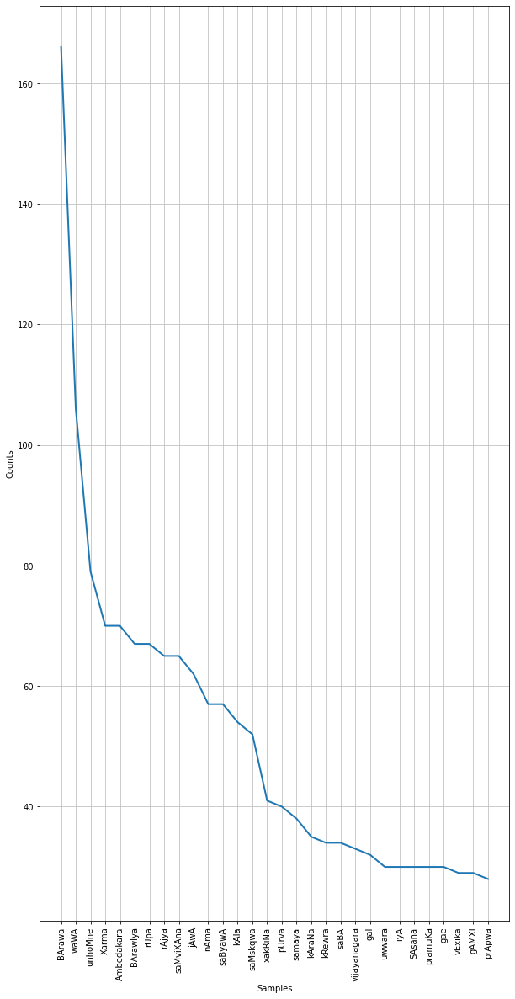

In [64]:
tokens = nltk.tokenize.word_tokenize(cod)
fd = nltk.FreqDist(tokens)
fd.plot(30,cumulative=False)

# TOKENIZATION OF SENTENCES
Text cleaning for **sentence tokenization** of Hindi text. It is important to note that-

1.   In Hindi, the sentence ends with the punctuation- "|" or "?" or "!". Thus we can remove all other punctuation from the text.
2.   We remove all numbers and special symbols from the text since we are doing sentence tokenisation.


In [65]:
text_sentences = text_f

In [66]:
from indicnlp.tokenize import sentence_tokenize

indic_string=text_sentences
sentences=sentence_tokenize.sentence_split(indic_string, lang='hi')
for t in sentences:
    print(t)

Streaming output truncated to the last 5000 lines.
1915 में उनकी भारत वापसी हुई।
उसके बाद उन्होंने यहाँ के किसानों, श्रमिकों और नगरीय श्रमिकों को अत्यधिक भूमि कर और भेदभाव के विरुद्ध आवाज उठाने के लिये एकजुट किया।
1921 में भारतीय राष्ट्रीय कांग्रेस की बागडोर संभालने के बाद उन्होंने देशभर में दरिद्रता से मुक्ति दिलाने, महिलाओं के अधिकारों का विस्तार, धार्मिक एवं जातीय एकता का निर्माण व आत्मनिर्भरता के लिये अस्पृश्‍यता के विरोध में अनेकों कार्यक्रम चलाये।
इन सबमें विदेशी राज से मुक्ति दिलाने वाला स्वराज की प्राप्ति वाला कार्यक्रम ही प्रमुख था।
गाँधी जी ने ब्रिटिश सरकार द्वारा भारतीयों पर लगाये गये लवण कर के विरोध में 1930 में नमक सत्याग्रह और इसके बाद 1942 में अंग्रेजो भारत छोड़ो आन्दोलन से विशेष विख्याति प्राप्त की।
दक्षिण अफ्रीका और भारत में विभिन्न अवसरों पर कई वर्षों तक उन्हें कारागृह में भी रहना पड़ा।
कम आयु में विवाह गांधी जी ने सभी परिस्थितियों में अहिंसा और सत्य का पालन किया और सभी को इनका पालन करने के लिये वकालत भी की।
उन्होंने साबरमती आश्रम में अपना जीवन बिताया और परम्परागत भार

In [67]:
#remove brackets content
text_sentences = re.sub(r"[\([{})\]]", "", text_sentences)
#remove punctuations
text_sentences = "".join(u for u in text_sentences if u not in ("@",",", ".", ";", ":","#","$","%","&","–","-","_"))
text_sentences = "".join(j for j in text_sentences if j not in ("a","b","c","d","e","f","g","h","i","j","k","l","m","n","o","p","q","r","s","t","u","v","w","x","y","z","A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"))
#text_words = "".join(j for j in text_words if not j.isalpha())
text_sentences = "".join([i for i in text_sentences if not i.isdigit()])
#text_words_f = "".join(filter(lambda x: not x.isdigit(), text_words))

In [68]:
import nltk
nltk.download('indian')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package indian to /root/nltk_data...
[nltk_data]   Package indian is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

# PARTS OF SPEECH TAGGING
The code below does POS tagging for hindi corpus of sentences. Each sentences appears in a distionary format along with its tagged token in a list.
However, we observe that several tokens are 'Unk' since, the model is not able to classify them.

In [69]:
from nltk.tag import tnt 
from nltk.corpus import indian 
train_data = indian.tagged_sents('hindi.pos') 
tnt_pos_tagger = tnt.TnT() 
tnt_pos_tagger.train(train_data)

In [70]:
text_sentences = text_sentences.split(' ')
text_sentences = list(filter(None, text_sentences))
text_sentences = ' '.join(text_sentences)

In [71]:
text_finality = text_sentences

In [72]:
from indicnlp.tokenize import sentence_tokenize

indic_string=text_sentences
sentences=sentence_tokenize.sentence_split(indic_string, lang='hi')
sentences=sentences[:20]
for t in sentences:
  text_sentences = "".join(u for u in text_sentences if u not in ("@",",", ".", ";", ":","#","$","%","&","–","-","_"))
  tagged_words = (tnt_pos_tagger.tag(nltk.word_tokenize(t))) 
  print(tagged_words)

[('भारत', 'NNC'), ('आधिकारिक', 'NNC'), ('नाम', 'NN'), ('भारत', 'NNP'), ('गणराज्य', 'Unk'), ('अंग्रेज़ी', 'Unk'), ('दक्षिण', 'NNPC'), ('एशिया', 'NNP'), ('में', 'PREP'), ('स्थित', 'JJ'), ('भारतीय', 'NNC'), ('उपमहाद्वीप', 'NN'), ('का', 'PREP'), ('सबसे', 'INTF'), ('बड़ा', 'Unk'), ('देश', 'NN'), ('है।', 'Unk')]
[('भारत', 'NNP'), ('भौगोलिक', 'Unk'), ('दृष्टि', 'NN'), ('से', 'PREP'), ('विश्व', 'NN'), ('का', 'PREP'), ('सातवाँ', 'Unk'), ('सबसे', 'INTF'), ('बड़ा', 'Unk'), ('देश', 'NN'), ('है', 'VFM'), ('जबकि', 'RB'), ('जनसंख्या', 'Unk'), ('के', 'PREP'), ('दृष्टिकोण', 'Unk'), ('से', 'PREP'), ('चीन', 'Unk'), ('के', 'PREP'), ('बाद', 'PREP'), ('दूसरा', 'QFNUM'), ('सबसे', 'INTF'), ('बड़ा', 'Unk'), ('देश', 'NN'), ('है।', 'Unk')]
[('भारत', 'NNP'), ('के', 'PREP'), ('पश्चिम', 'Unk'), ('में', 'PREP'), ('पाकिस्तान', 'NNP'), ('उत्तरपूर्व', 'Unk'), ('में', 'PREP'), ('चीन', 'Unk'), ('नेपाल', 'Unk'), ('और', 'CC'), ('भूटान', 'Unk'), ('पूर्व', 'PREP'), ('में', 'PREP'), ('बांग्लादेश', 'Unk'), ('और', 'CC'), ('म्या

# STEMMING OF HINDI TEXT
We remove the suffixes from each token in the corpus and print them as **stems**.


In [73]:
#remove brackets content
text_stems = re.sub(r"[\([{})\]]", "", text_stem)
#remove punctuations
text_stems = "".join(u for u in text_stems if u not in ("@",",","?", ".", ";", ":","'","!","#","$","%","&","–","-","_"))
#text_stems = "".join(j for j in text_stems if not j.isalpha())
text_stems_f = "".join([i for i in text_stems if not i.isdigit()])
#text_words_f = "".join(filter(lambda x: not x.isdigit(), text_words))
print(text_stems_f)



भारत आधिकारिक नाम भारत गणराज्य अंग्रेज़ी    दक्षिण एशिया में स्थित भारतीय उपमहाद्वीप का सबसे बड़ा देश है भारत भौगोलिक दृष्टि से विश्व का सातवाँ सबसे बड़ा देश है जबकि जनसंख्या के दृष्टिकोण से चीन के बाद दूसरा सबसे बड़ा देश है भारत के पश्चिम में पाकिस्तान उत्तरपूर्व में चीन नेपाल और भूटान पूर्व में बांग्लादेश और म्यान्मार स्थित हैं हिन्द महासागर में इसके दक्षिण पश्चिम में मालदीव दक्षिण में श्रीलंका और दक्षिणपूर्व में इंडोनेशिया से भारत की सामुद्रिक सीमा लगती है इसके उत्तर में हिमालय पर्वत तथा दक्षिण में हिन्द महासागर स्थित है दक्षिणपूर्व में बंगाल की खाड़ी तथा पश्चिम में अरब सागर है नामोत्पत्ति आधुनिक मानव या होमो सेपियन्स अफ्रीका से भारतीय उपमहाद्वीप में  साल पहले आये थे   वर्ष पहले ये सिंधु नदी के पश्चिमी हिस्से की तरफ बसे हुए थे जहाँ से इन्होने धीरे धीरे पलायन किया और सिंधुघाटी की सभ्यता के रूप में विकसित हुए   ईसा पूर्व संस्कृत भाषा सम्पूर्ण भारतीय उपमहाद्वीप में फैली हुए थी और तब तक यहाँ पर हिन्दू धर्म का उद्धव हो चुका था और ऋग्वेद की रचना भी हो चुकी थी   ईसा पूर्व तक आते आते हिन्दू

In [74]:
#installing dependencies
import codecs
import re

sentences=text_stems_f.split(u"।") #since hindi sentences end with '|'
words_list = list()
for sentence in sentences:
    words = sentence.split(' ') #words are seperated by a space in hindi
    words_list += words

suffixes = {
    1: [u"ो",u"े",u"ू",u"ु",u"ी",u"ि",u"ा"],
    2: [u"कर",u"ाओ",u"िए",u"ाई",u"ाए",u"ने",u"नी",u"ना",u"ते",u"ीं",u"ती",u"ता",u"ाँ",u"ां",u"ों",u"ें"],
    3: [u"ाकर",u"ाइए",u"ाईं",u"ाया",u"ेगी",u"ेगा",u"ोगी",u"ोगे",u"ाने",u"ाना",u"ाते",u"ाती",u"ाता",u"तीं",u"ाओं",u"ाएं",u"ुओं",u"ुएं",u"ुआं"],
    4: [u"ाएगी",u"ाएगा",u"ाओगी",u"ाओगे",u"एंगी",u"ेंगी",u"एंगे",u"ेंगे",u"ूंगी",u"ूंगा",u"ातीं",u"नाओं",u"नाएं",u"ताओं",u"ताएं",u"ियाँ",u"ियों",u"ियां"],
    5: [u"ाएंगी",u"ाएंगे",u"ाऊंगी",u"ाऊंगा",u"ाइयाँ",u"ाइयों",u"ाइयां"],
} #suffixes tin hindi language that change tense, gender, number but not the meaning

stems=list()
for word in words_list:
    for L in range(1,5): 
        if len(word) >= L + 1:
            for suffix in suffixes[L]:
                if word.endswith(suffix):
                    word=word[:-L] #stripping the suffix from the word
    if word:
        stems.append(word)

In [75]:
words_list = list(filter(None, words_list))
print(len(words_list))

129485


### Here, we restrict the output to increase the computational time. In order to see more words, we can change the number in 'range()'.

In [76]:
print("{0:20}{1:20}".format("WORD","STEM"))
for i in range(100):
    print("{0:20}{1:20}".format(words_list[i],stems[i]))

WORD                STEM                
भारत                भारत                
आधिकारिक            आधिकारिक            
नाम                 नाम                 
भारत                भारत                
गणराज्य             गणराज्य             
अंग्रेज़ी           अंग्रेज़            
दक्षिण              दक्षिण              
एशिया               एशिय                
में                 म                   
स्थित               स्थित               
भारतीय              भारतीय              
उपमहाद्वीप          उपमहाद्वीप          
का                  क                   
सबसे                सबस                 
बड़ा                बड़                 
देश                 देश                 
है                  है                  
भारत                भारत                
भौगोलिक             भौगोलिक             
दृष्टि              दृष्ट               
से                  स                   
विश्व               विश्व               
का                  क                   
सातवाँ          

In [77]:
wx_wlist = ' '.join(words_list)
# Let's remove the stop words before printing most common words 
from spacy.lang.hi import Hindi

nlp = Hindi()

doc = nlp(wx_wlist)

not_stop_words = []
for token in doc:
  if token.is_stop:
    continue
  if token.is_punct or token.text =="|":
    continue 
  not_stop_words.append(token.text)

for i in range(len(not_stop_words)):
  not_stop_words[i] = con.convert(not_stop_words[i])
not_stop_cnt = Counter(not_stop_words)
#ot_stop_cnt = Counter(con.convert(not_stop_words))
not_stop_cnt.most_common(20)

[('BArawa', 1036),
 ('waWA', 516),
 ('BArawIya', 445),
 ('rUpa', 431),
 ('jAwA', 344),
 ('rAjya', 319),
 ('unhoMne', 289),
 ('saBA', 273),
 ('nAma', 267),
 ('saMviXAna', 252),
 ('sarakAra', 249),
 ('samaya', 246),
 ('saxasya', 222),
 ('britiSa', 211),
 ('gAMXI', 199),
 ('sAmrAjya', 196),
 ('gae', 196),
 ('anusAra', 195),
 ('saMsaxa', 195),
 ('prApwa', 193)]

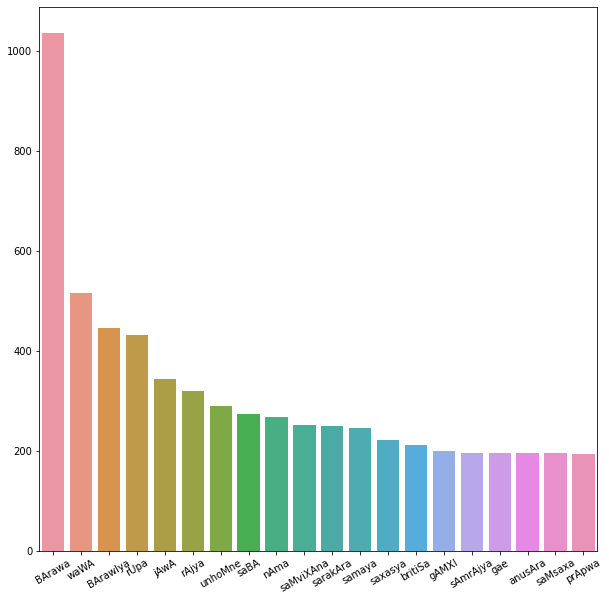

In [78]:
import seaborn as sns

all_fdist = FreqDist(not_stop_cnt).most_common(20)
all_fdist = pd.Series(dict(all_fdist))
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax)
plt.xticks(rotation=30);

In [79]:
!pip install stanza
import stanza

In [80]:
text_finality

'भारत आधिकारिक नाम भारत गणराज्य अंग्रेज़ी दक्षिण एशिया में स्थित भारतीय उपमहाद्वीप का सबसे बड़ा देश है। भारत भौगोलिक दृष्टि से विश्व का सातवाँ सबसे बड़ा देश है जबकि जनसंख्या के दृष्टिकोण से चीन के बाद दूसरा सबसे बड़ा देश है। भारत के पश्चिम में पाकिस्तान उत्तरपूर्व में चीन नेपाल और भूटान पूर्व में बांग्लादेश और म्यान्मार स्थित हैं। हिन्द महासागर में इसके दक्षिण पश्चिम में मालदीव दक्षिण में श्रीलंका और दक्षिणपूर्व में इंडोनेशिया से भारत की सामुद्रिक सीमा लगती है। इसके उत्तर में हिमालय पर्वत तथा दक्षिण में हिन्द महासागर स्थित है। दक्षिणपूर्व में बंगाल की खाड़ी तथा पश्चिम में अरब सागर है। नामोत्पत्ति आधुनिक मानव या होमो सेपियन्स अफ्रीका से भारतीय उपमहाद्वीप में साल पहले आये थे। वर्ष पहले ये सिंधु नदी के पश्चिमी हिस्से की तरफ बसे हुए थे जहाँ से इन्होने धीरे धीरे पलायन किया और सिंधुघाटी की सभ्यता के रूप में विकसित हुए। ईसा पूर्व संस्कृत भाषा सम्पूर्ण भारतीय उपमहाद्वीप में फैली हुए थी और तब तक यहाँ पर हिन्दू धर्म का उद्धव हो चुका था और ऋग्वेद की रचना भी हो चुकी थी। ईसा पूर्व तक आते आते हिन्दू

In [81]:
text_finality_to=sentence_tokenize.sentence_split(text_finality, lang='hi')

# LEMMATIZATION OF HINDI TEXT
We use Stanford NLP to generate more accurate lemma and POS tags on the Hindi corpus. It is important to note that Stanford NLP classifies the POS tags more accurately as compared to NLTK.



**IMPORTANT NOTE: U CAN TERMINATE THE PROGRAM AFTER A COUPLE OF SENTENCES.** 
The entire function takes several minutes to run. If u stop the code after a suitable time, there are enough Lemma and POS tags appended to the their repsective list for our frequency analysis.

In [82]:
stanza.download('hi')
s_lemma = []
s_pos = []
nlp = stanza.Pipeline('hi')
for i in text_finality_to:
  doc = nlp(i)
  for sentence in doc.sentences:
    for word in sentence.words:
        s_lemma.append(word.lemma)
        s_pos.append(word.pos)
        print("{:12s}\t{:12s}\t{:6s}".format(word.text, word.lemma, word.pos))

2021-07-02 05:23:42 INFO: Downloading default packages for language: hi (Hindi)...


2021-07-02 05:23:43 INFO: File exists: /root/stanza_resources/hi/default.zip.
2021-07-02 05:23:45 INFO: Finished downloading models and saved to /root/stanza_resources.
2021-07-02 05:23:45 INFO: Loading these models for language: hi (Hindi):
| Processor | Package |
-----------------------
| tokenize  | hdtb    |
| pos       | hdtb    |
| lemma     | hdtb    |
| depparse  | hdtb    |

2021-07-02 05:23:45 INFO: Use device: cpu
2021-07-02 05:23:45 INFO: Loading: tokenize
2021-07-02 05:23:45 INFO: Loading: pos
2021-07-02 05:23:46 INFO: Loading: lemma
2021-07-02 05:23:46 INFO: Loading: depparse
2021-07-02 05:23:46 INFO: Done loading processors!


Streaming output truncated to the last 5000 lines.
विविध       	विविध       	ADJ   
भारतीय      	भारतीय      	ADJ   
देवताओं     	देवता       	NOUN  
जैसे        	जैसा        	ADP   
अग्नि       	अग्नि       	PROPN 
वायु        	वायु        	PROPN 
जल          	जल          	PROPN 
सोम         	सोम         	PROPN 
आदि         	आदि         	PART  
का          	का          	ADP   
वर्णन       	वर्णन       	NOUN  
है          	है          	VERB  
।           	।           	PUNCT 
मातृभाषी    	मातृभाषी    	ADJ   
ऋग्वेद      	ऋग्वेद      	PROPN 
के          	का          	ADP   
विषय        	विषय        	NOUN  
में         	में         	ADP   
कुछ         	कुछ         	DET   
प्रमुख      	प्रमुख      	ADJ   
बातें       	बात         	NOUN  
निम्नलिखित  	निम्नलिखित  	ADJ   
है          	है          	AUX   
व्याकरण     	व्याकरण     	NOUN  
इस          	यह          	DET   
पाठ         	पाठ         	NOUN  
को          	को          	ADP   
दस          	दस          	NUM   
मण्डलों     	मण्डल       

KeyboardInterrupt: ignored

## Frequeny Graph For Lemmatization

In [83]:
s_lemma = ' '.join(s_lemma)
# Let's remove the stop words before printing most common words 
from spacy.lang.hi import Hindi

nlp = Hindi()

doc = nlp(s_lemma)

not_stop_words = []
for token in doc:
  if token.is_stop:
    continue
  if token.is_punct or token.text =="|":
    continue 
  not_stop_words.append(token.text)

for i in range(len(not_stop_words)):
  not_stop_words[i] = con.convert(not_stop_words[i])
not_stop_cnt = Counter(not_stop_words)
#ot_stop_cnt = Counter(con.convert(not_stop_words))
not_stop_cnt.most_common(20)

[('BArawa', 406),
 ('xe', 400),
 ('waWA', 237),
 ('raha', 229),
 ('BArawIya', 202),
 ('rUpa', 194),
 ('le', 186),
 ('kaha', 169),
 ('gAMXI', 166),
 ('rAjya', 164),
 ('Xarma', 158),
 ('Ambedakara', 139),
 ('saMskqwa', 132),
 ('nAma', 126),
 ('samaya', 121),
 ('xeSa', 113),
 ('BARA', 111),
 ('bana', 110),
 ('mila', 109),
 ('vexa', 107)]

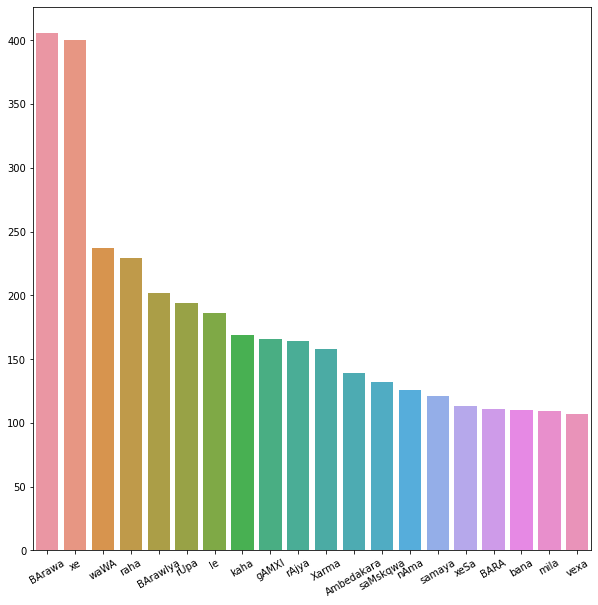

In [84]:
import seaborn as sns

all_fdist = FreqDist(not_stop_cnt).most_common(20)
all_fdist = pd.Series(dict(all_fdist))
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax)
plt.xticks(rotation=30);

## Frequency Graph For POS Tagging

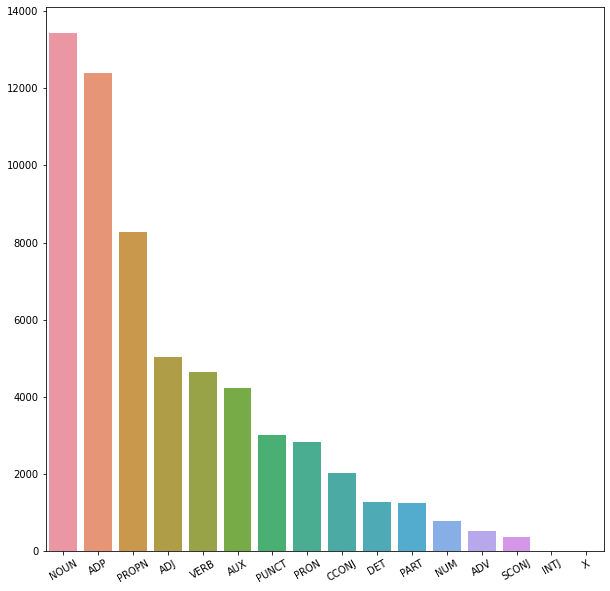

In [85]:
import seaborn as sns

all_fdist = FreqDist(s_pos).most_common(20)
all_fdist = pd.Series(dict(all_fdist))
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax)
plt.xticks(rotation=30);

# HINDI WORCLOUD GENERATION
Rather than using WX notation, we render Hindi fonts into the WordClouds.

In [87]:
#rendering hindi text in wordcloud 
from wordcloud import WordCloud
from spacy.lang.hi import STOP_WORDS as STOP_WORDS_HI
import matplotlib.pyplot as plt

In [88]:
# the issue is highlighted here: https://github.com/amueller/word_cloud/issues/70
import requests
url = "https://hindityping.info/download/assets/Hindi-Fonts-Unicode/gargi.ttf"

r = requests.get(url, allow_redirects=True)
font_path="gargi.ttf"

with open(font_path, "wb") as fw:
  fw.write(r.content)

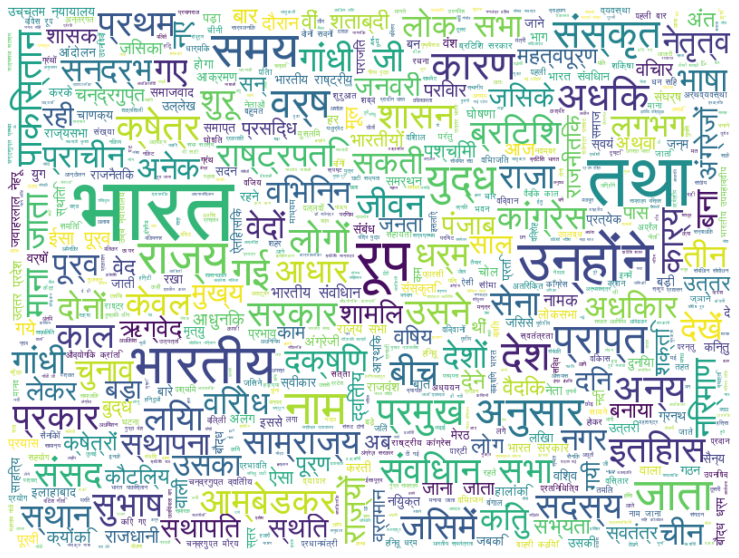

In [89]:
wordcloud = WordCloud(
    width=800,
    height=600,
    max_font_size=100, 
    max_words=1000,
    background_color="white", 
    stopwords=STOP_WORDS_HI,
    regexp=r"[\u0900-\u097F]+", 
    font_path=font_path
).generate(text_words_f)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## **END OF NOTEBOOK. THANK YOU! :)**